In [ ]:
from sklearn.preprocessing import StandardScaler
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [15]:
df = pd.read_csv('data\processed\dataset_new.csv')

In [16]:
df.drop(columns=['target'], inplace = True)

In [17]:
df.head(10)

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.7150,87.917,4,acoustic
1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.2670,77.489,4,acoustic
2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.1200,76.332,4,acoustic
3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.1430,181.740,3,acoustic
4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.1670,119.949,4,acoustic
5,01MVOl9KtVTNfFiBU9I7dc,Tyrone Wells,Days I Will Remember,Days I Will Remember,58,214240,False,0.688,0.4810,6,-8.807,1,0.1050,0.2890,0.000000,0.1890,0.6660,98.017,4,acoustic
6,6Vc5wAMmXdKIAM7WUoEb7N,A Great Big World;Christina Aguilera,Is There Anybody Out There?,Say Something,74,229400,False,0.407,0.1470,2,-8.822,1,0.0355,0.8570,0.000003,0.0913,0.0765,141.284,3,acoustic
7,1EzrEOXmMH3G43AXT1y7pA,Jason Mraz,We Sing. We Dance. We Steal Things.,I'm Yours,80,242946,False,0.703,0.4440,11,-9.331,1,0.0417,0.5590,0.000000,0.0973,0.7120,150.960,4,acoustic
8,0IktbUcnAGrvD03AWnz3Q8,Jason Mraz;Colbie Caillat,We Sing. We Dance. We Steal Things.,Lucky,74,189613,False,0.625,0.4140,0,-8.700,1,0.0369,0.2940,0.000000,0.1510,0.6690,130.088,4,acoustic
9,7k9GuJYLp2AzqokyEdwEw2,Ross Copperman,Hunger,Hunger,56,205594,False,0.442,0.6320,1,-6.770,1,0.0295,0.4260,0.004190,0.0735,0.1960,78.899,4,acoustic


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 89515 entries, 0 to 89514
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   track_id          89515 non-null  object 
 1   artists           89515 non-null  object 
 2   album_name        89515 non-null  object 
 3   track_name        89515 non-null  object 
 4   popularity        89515 non-null  int64  
 5   duration_ms       89515 non-null  int64  
 6   explicit          89515 non-null  bool   
 7   danceability      89515 non-null  float64
 8   energy            89515 non-null  float64
 9   key               89515 non-null  int64  
 10  loudness          89515 non-null  float64
 11  mode              89515 non-null  int64  
 12  speechiness       89515 non-null  float64
 13  acousticness      89515 non-null  float64
 14  instrumentalness  89515 non-null  float64
 15  liveness          89515 non-null  float64
 16  valence           89515 non-null  float6

## Pair plot

Generazione del grafico in corso...


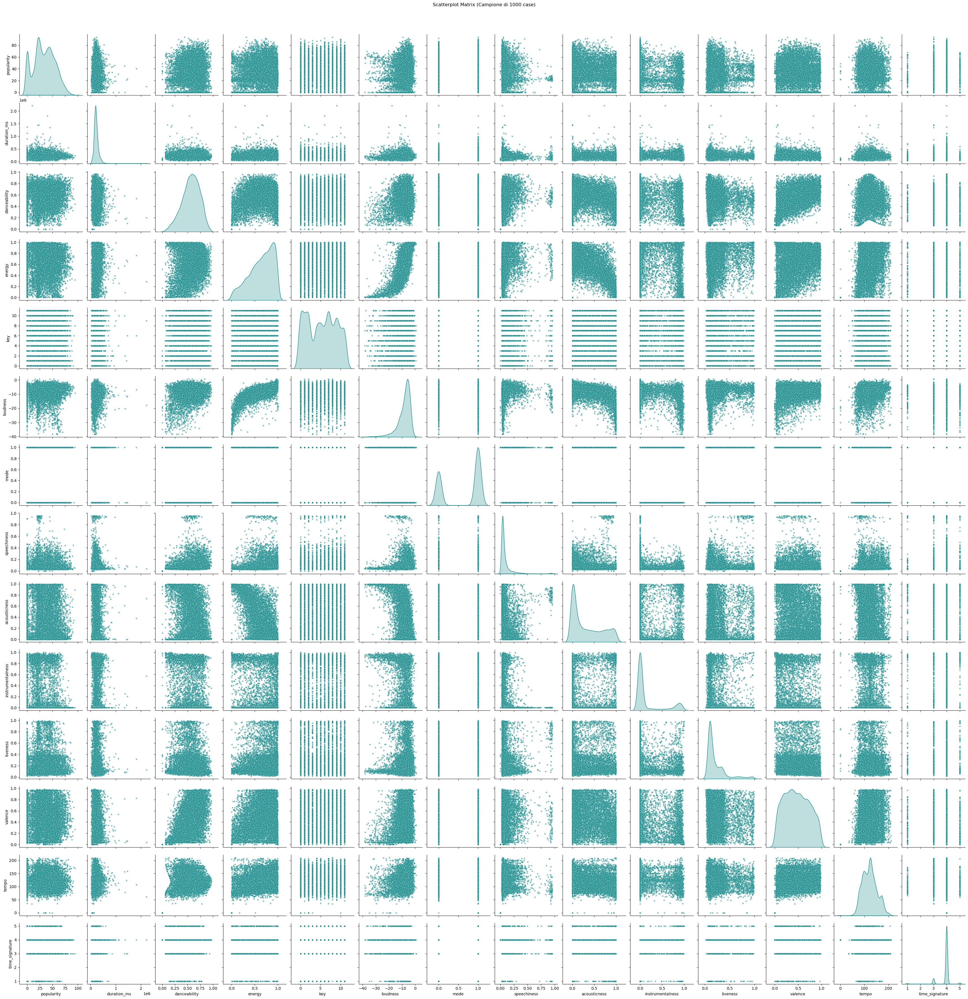

In [6]:
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Selezione delle Feature più interessanti
cols_to_plot = df.select_dtypes(include=['number']).columns

# 2. Campionamento dei dati
df_sample = df[cols_to_plot].sample(n=10000, random_state=42)

print("Generazione del grafico in corso...")
g = sns.pairplot(df_sample, 
                 diag_kind='kde', 
                 plot_kws={'alpha': 0.5, 's': 15, 'color': 'teal'},
                 diag_kws={'color': 'teal', 'fill': True},
                 height=2.5)

g.fig.suptitle('Scatterplot Matrix (Campione di 1000 case)', y=1.02)
plt.show()

## correlation matrix

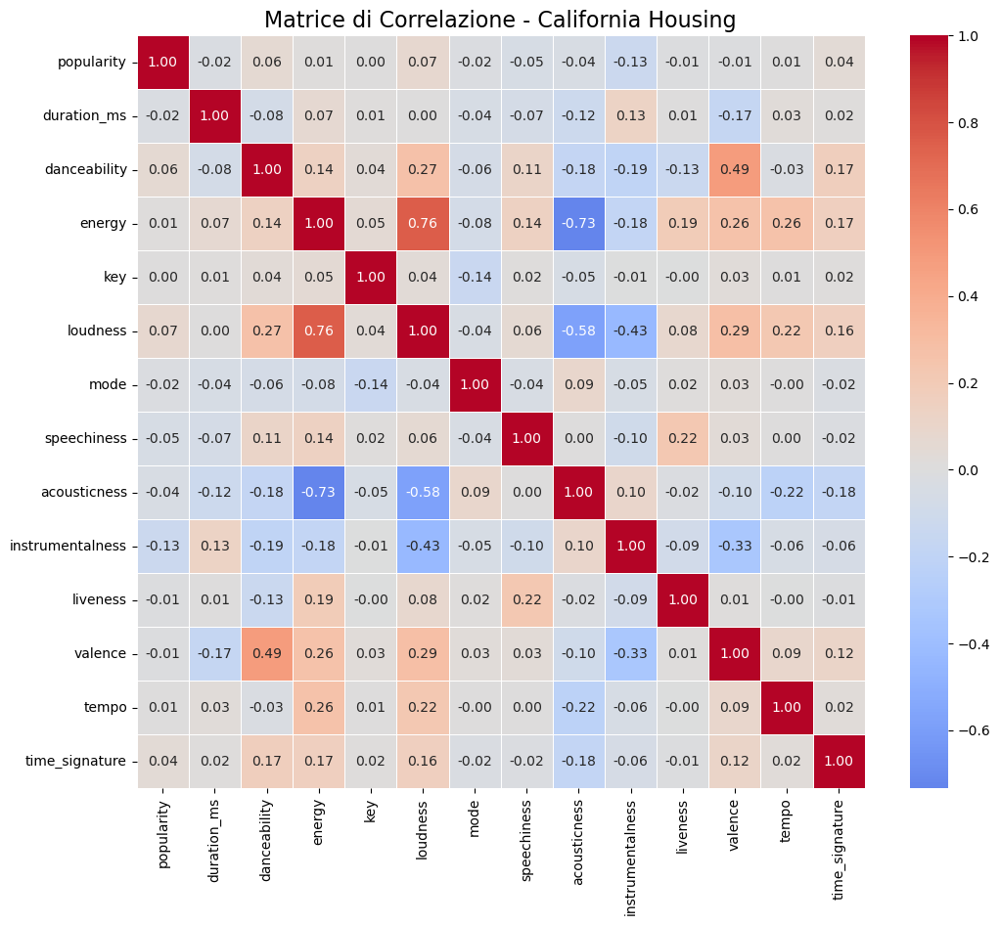

In [7]:
# 1. Calcolo la matrice di correlazione (coefficiente di Pearson)
corr_matrix = df[cols_to_plot].corr()

# 2. Setup della figura
plt.figure(figsize=(12, 10))

# 3. Creazione della Heatmap
sns.heatmap(corr_matrix, 
            annot=True, 
            cmap='coolwarm', 
            center=0, 
            linewidths=0.5, 
            linecolor='white',
            fmt=".2f")

plt.title('Matrice di Correlazione - California Housing', fontsize=16)
plt.show()

## feature engeneering

In [18]:
df['dance_energy'] = df['danceability'] * df['energy']
df['happy_energy'] = df['valence'] * df['energy']
df['acoustic_ratio'] = df['acousticness'] / (df['instrumentalness'] + 1e-5)
df['speech_ratio'] = df['speechiness'] / (df['energy'] + 1e-5)

df['loudness_abs'] = df['loudness'].abs()
df['loudness_energy'] = df['loudness_abs'] * df['energy']

#complessità musicale 
#combina instrumentalness, time-sig e tempo riportandole tutte approssimatamente fra 0 e 1
df['musical_complexity'] = (
    df['instrumentalness'] +
    df['time_signature'] / 7 + 
    df['tempo'] / 250
)


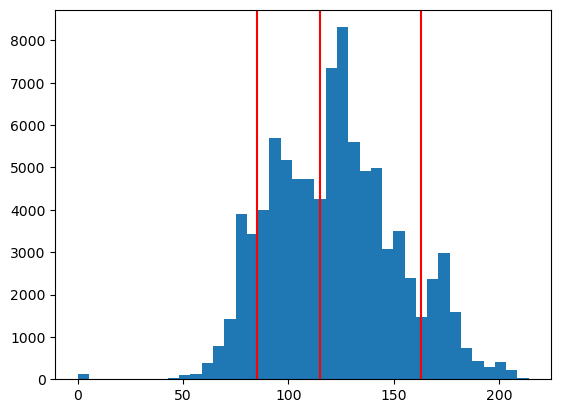

In [21]:
plt.hist(df['tempo'], bins=40)
plt.axvline(85, color='red')
plt.axvline(115, color='red')
plt.axvline(163, color='red')
plt.show()

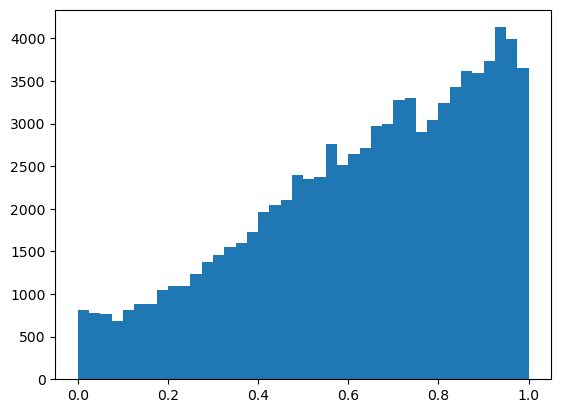

In [22]:
_ = plt.hist(df['energy'], bins=40)

In [23]:
#binning di features
df['valence_bin'] = pd.cut(df['valence'], bins=[0, 0.3, 0.7, 1], labels=[0,1,2]) # divisione bilanciata
df['energy_bin'] = pd.qcut(df['energy'], q=3, labels=[0, 1, 2]) #divisione con quantili
df['tempo_bin'] = pd.cut(df['tempo'], bins=[0, 80, 115, 163, 250], labels=[0,1,2,4]) #divisioni basate sulla distribuzione che appare multimodale

In [12]:
df.columns

Index(['track_id', 'artists', 'album_name', 'track_name', 'popularity',
       'duration_ms', 'explicit', 'danceability', 'energy', 'key', 'loudness',
       'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'time_signature', 'track_genre', 'dance_energy',
       'happy_energy', 'acoustic_ratio', 'speech_ratio', 'loudness_abs',
       'loudness_energy', 'musical_complexity', 'valence_bin', 'energy_bin',
       'tempo_bin'],
      dtype='object')

### language detection

In [35]:
df_sample = df.sample(
    n=5000,
    random_state=42
)

In [74]:
from langdetect import detect, DetectorFactory
DetectorFactory.seed = 0

def detect_language_safe(text):
    if not isinstance(text, str) or len(text.strip()) < 10:
        return 'unknown'
    try:
        return detect(text)
    except:
        return 'unknown'

df['text_for_lang'] = (
    df['track_name'].astype(str) + ' ' +
    df['album_name'].astype(str)
)


df['lang'] = df['text_for_lang'].apply(detect_language_safe)

In [102]:
# Maschera come Series di pandas
mask = (df['instrumentalness'] > 0.7) & (df['speechiness'] < df['speechiness'].quantile(0.25) )

# Assicurati che 'lang' sia stringa
df['lang'] = df['lang'].astype(str)

# Assegna i valori
df.loc[mask, 'lang'] = 'instrumental'

In [93]:
# Imposta il numero minimo di occorrenze
min_count = 0
# Trova le lingue con occorrenze maggiori di min_count
top_langs = df['lang'].value_counts()
top_langs = top_langs[top_langs > min_count].index

# Mantieni solo le lingue con abbastanza elementi, tutte le altre diventano 'other'
prova = df['lang'].where(df['lang'].isin(top_langs), 'other')

In [94]:
print(len(prova.value_counts()))
prova.value_counts()

44


lang
en              37877
instrumental    13352
pt               6938
es               6000
de               4771
id               1634
it               1418
fr               1411
unknown          1402
nl               1245
ja               1111
tr               1092
ca                988
sv                947
tl                919
ko                746
so                739
et                733
af                705
ru                647
no                588
fi                530
sw                520
ro                506
da                500
pl                364
cy                299
sl                278
hr                206
vi                176
lt                149
zh-tw             128
sk                113
cs                107
hu                 94
bg                 87
sq                 85
zh-cn              55
lv                 27
mk                 13
uk                 11
el                  2
th                  1
ml                  1
Name: count, dtype: int64

In [95]:
prova.value_counts(normalize=True)

lang
en              0.423136
instrumental    0.149159
pt              0.077507
es              0.067028
de              0.053298
id              0.018254
it              0.015841
fr              0.015763
unknown         0.015662
nl              0.013908
ja              0.012411
tr              0.012199
ca              0.011037
sv              0.010579
tl              0.010266
ko              0.008334
so              0.008256
et              0.008189
af              0.007876
ru              0.007228
no              0.006569
fi              0.005921
sw              0.005809
ro              0.005653
da              0.005586
pl              0.004066
cy              0.003340
sl              0.003106
hr              0.002301
vi              0.001966
lt              0.001665
zh-tw           0.001430
sk              0.001262
cs              0.001195
hu              0.001050
bg              0.000972
sq              0.000950
zh-cn           0.000614
lv              0.000302
mk              0.00

In [96]:
df['lang'] = prova

In [104]:
df['has_vocals'] = (df['speechiness'] > df['speechiness'].quantile(0.25)).astype(int)
df['is_english'] = (df['lang'] == 'en').astype(int)

In [72]:
df_sample['lang'].value_counts()

lang
en              2144
other            874
instrumental     754
pt               382
es               312
de               267
it                97
id                96
unknown           74
Name: count, dtype: int64

In [65]:
#df_sample[df_sample['lang'] == 'fr']

In [20]:
audio_cols = [
    'danceability','energy','speechiness',
    'acousticness','instrumentalness','valence'
]

df_sample.groupby('lang')[audio_cols].mean().sort_values('speechiness')




,danceability,energy,speechiness,acousticness,instrumentalness,valence
lang,,,,,,
instrumental,0.497520,0.519312,0.058980,0.433504,0.871788,0.290453
sv,0.546022,0.673620,0.062633,0.336190,0.059258,0.525769
ja,0.539946,0.778179,0.063007,0.235556,0.015149,0.569929
es,0.589522,0.680297,0.071608,0.341466,0.020969,0.626972
it,0.498364,0.534019,0.074314,0.498304,0.072220,0.400957
pt,0.583059,0.675107,0.074392,0.402026,0.009805,0.593037
ca,0.617853,0.657061,0.089318,0.313697,0.047938,0.536880
other,0.585888,0.632050,0.090356,0.344055,0.041442,0.481655
tr,0.628302,0.627170,0.092321,0.284838,0.016153,0.459526


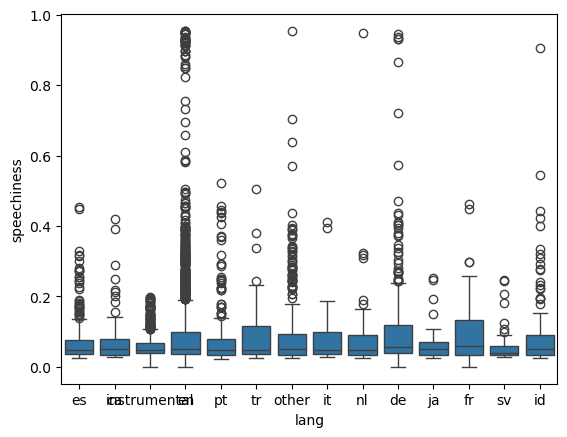

In [21]:
import seaborn as sns
import matplotlib.pyplot as plt

#plt.figure(figsize=(7,10))
sns.boxplot(
    data=df_sample[df_sample['lang'].isin(df_sample['lang'].unique())],
    x='lang',
    y='speechiness'
)
plt.show()

### altre features

In [22]:
#popularità media
artist_pop = df.groupby('artists')['popularity'].mean()
df['artist_avg_popularity'] = df['artists'].map(artist_pop)

#barni per artista
artist_count = df['artists'].value_counts()
df['artist_track_count'] = df['artists'].map(artist_count)

#top generi
top_genres = df['track_genre'].value_counts().nlargest(52).index
df['track_genre_clean'] = df['track_genre'].where(
    df['track_genre'].isin(top_genres),
    'other'
)

In [23]:
# Conteggi assoluti per genere
counts = df['track_genre'].value_counts()

# Filtra solo quelli con più di 10 brani
top_counts = counts[counts > 0.01*89515]

print(top_counts)
print(len(top_counts))

track_genre
acoustic          1000
tango              999
ambient            998
forro              998
cantopop           998
study              998
heavy-metal        997
alt-rock           997
black-metal        996
bluegrass          996
disney             995
anime              995
afrobeat           994
j-idol             993
happy              991
club               991
breakbeat          989
chicago-house      989
salsa              988
idm                987
malay              986
grindcore          984
honky-tonk         981
iranian            975
kids               974
new-age            974
deep-house         972
chill              972
comedy             970
children           967
drum-and-bass      953
detroit-techno     951
country            946
dance              946
sleep              945
spanish            941
blues              937
dancehall          937
brazil             937
dub                933
emo                932
disco              926
world-music        920

<Axes: ylabel='Frequency'>

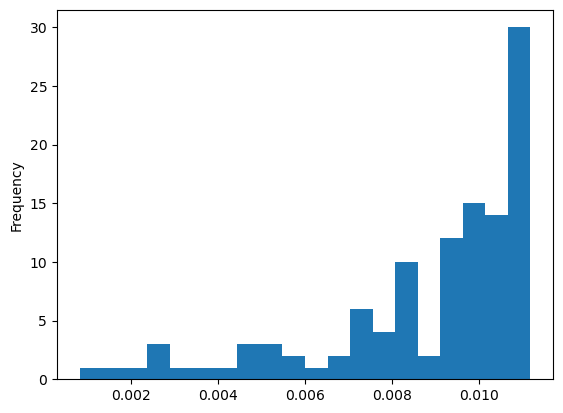

In [24]:
df['track_genre'].value_counts(normalize=True).plot.hist(bins=20)

# generazione csv con feature ingegnerizzate

In [100]:
df_sample.to_csv(r'data\processed\dataset_new_engeenered.csv', index=False)

### quadrati

In [67]:
from itertools import combinations

# Selezioniamo le feature numeriche su cui vogliamo fare feature engineering
numerical_features = [
    'popularity', 'duration_ms', 'danceability', 'energy', 'loudness', 
    'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo'
]

# Scelta di alcune feature su cui creare quadrati e interazioni
selected_for_quadratic = ['danceability', 'energy', 'loudness', 'valence']
selected_for_interactions = ['danceability', 'energy', 'loudness', 'tempo']

# Creiamo i quadrati
for col in selected_for_quadratic:
    df[f'{col}_sq'] = df[col] ** 2

# Creiamo interazioni tra feature selezionate (moltiplicazioni)
for col1, col2 in combinations(selected_for_interactions, 2):
    df[f'{col1}_x_{col2}'] = df[col1] * df[col2]

# Creiamo interazioni tra quadrati e feature originali
for col in selected_for_quadratic:
    for orig_col in selected_for_interactions:
        df[f'{col}_sq_x_{orig_col}'] = df[f'{col}_sq'] * df[orig_col]

### feature bimodali e combinazioni

In [14]:
df.columns

Index(['Unnamed: 0', 'track_id', 'artists', 'album_name', 'track_name',
       'popularity', 'duration_ms', 'explicit', 'danceability', 'energy',
       'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature',
       'track_genre'],
      dtype='object')

In [107]:
# Soglie medie o mediane per creare feature binarie
energy_median = df['energy'].median()
danceability_median = df['danceability'].median()
valence_median = df['valence'].median()
laudness_median = df['loudness'].median()
liveness_median = df['liveness'].median()

# Creiamo feature bi-modali
df['high_energy'] = (df['energy'] > energy_median).astype(int)
df['high_danceable'] = (df['danceability'] > danceability_median).astype(int)
df['positive_valence'] = (df['valence'] > valence_median).astype(int)
df['high_loudness'] = (df['loudness'] > laudness_median).astype(int)
df['high_liveness'] = (df['liveness'] > liveness_median).astype(int)
# Ora creiamo interazioni tra feature bi-modali

# interazione fra energy e le altre
df['energy_x_dance'] = df['energy'] * df['high_danceable']

df['energy_x_valence'] = df['energy'] * df['positive_valence']

df['energy_x_loudness'] = df['energy'] * df['high_loudness']

df['energy_x_loudness'] = df['energy'] * df['high_liveness']

# Interazione tra danceability e valence
df['dance_x_valence'] = df['danceability'] * df['positive_valence']

# interazione fra laudness e le altre
df['loudness_x_danceability'] = df['loudness'] * df['high_danceable']

df['loudness_x_valence'] = df['loudness'] * df['positive_valence']

df['loudness_x_liveness'] = df['loudness'] * df['high_liveness']


Generazione del grafico in corso...


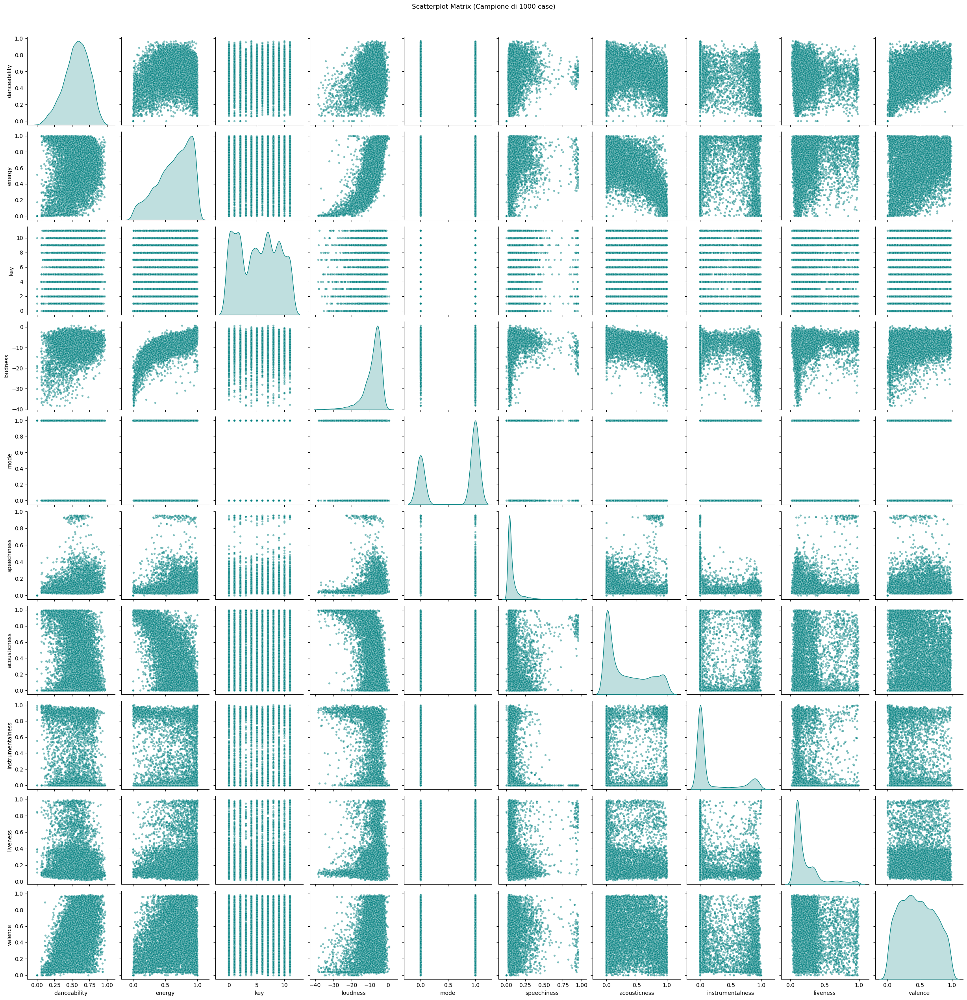

In [101]:
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Selezione delle Feature più interessanti
cols_to_plot = ['danceability', 'energy',
       'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence']

# 2. Campionamento dei dati
df_sample = df[cols_to_plot].sample(n=10000, random_state=42)

print("Generazione del grafico in corso...")
g = sns.pairplot(df_sample, 
                 diag_kind='kde', 
                 plot_kws={'alpha': 0.5, 's': 15, 'color': 'teal'},
                 diag_kws={'color': 'teal', 'fill': True},
                 height=2.5)

g.fig.suptitle('Scatterplot Matrix (Campione di 1000 case)', y=1.02)
plt.show()

In [110]:
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)

df.describe()

,popularity,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,dance_energy,happy_energy,acoustic_ratio,speech_ratio,loudness_abs,loudness_energy,musical_complexity,has_vocals,danceability_sq,energy_sq,loudness_sq,valence_sq,danceability_x_energy,danceability_x_loudness,danceability_x_tempo,energy_x_loudness,energy_x_tempo,loudness_x_tempo,danceability_sq_x_danceability,danceability_sq_x_energy,danceability_sq_x_loudness,danceability_sq_x_tempo,energy_sq_x_danceability,energy_sq_x_energy,energy_sq_x_loudness,energy_sq_x_tempo,loudness_sq_x_danceability,loudness_sq_x_energy,loudness_sq_x_loudness,loudness_sq_x_tempo,valence_sq_x_danceability,valence_sq_x_energy,valence_sq_x_loudness,valence_sq_x_tempo,is_english,high_energy,high_danceable,positive_valence,high_loudness,high_liveness,energy_x_dance,energy_x_valence,dance_x_valence,loudness_x_danceability,loudness_x_valence,loudness_x_liveness
count,89515.000000,8.951500e+04,89515.000000,89515.000000,89515.000000,89515.000000,89515.000000,89515.000000,89515.000000,89515.000000,89515.000000,89515.000000,89515.000000,89515.000000,89515.000000,89515.000000,89515.000000,89515.000000,89515.000000,89515.000000,89515.000000,89515.000000,89515.000000,8.951500e+04,89515.000000,89515.000000,89515.000000,89515.000000,89515.000000,89515.000000,89515.000000,89515.000000,89515.000000,89515.000000,89515.000000,89515.000000,89515.000000,8.951500e+04,89515.000000,89515.000000,89515.000000,8.951500e+04,89515.000000,89515.000000,89515.000000,89515.000000,89515.000000,89515.000000,89515.000000,89515.000000,89515.000000,89515.000000,89515.000000,89515.000000,89515.000000,89515.000000,89515.000000,89515.000000,89515.000000,89515.000000
mean,33.209417,2.284041e+05,0.562403,0.634781,5.283807,-8.483398,0.637022,0.087237,0.328080,0.172970,0.216690,0.469618,122.085096,3.904843,0.363371,0.315272,14698.987864,0.616683,8.483850,4.377010,1.219145,0.747975,0.347336,4.686008e-01,98.790565,0.289502,0.363371,-4.526641,68.522913,0.344337,79.465875,-1000.746099,0.228102,0.225841,-2.732361,42.096219,0.266258,3.714123e-01,-2.938551,59.431158,47.604035,3.824253e+01,-1560.104626,11186.711163,0.183488,0.199594,-2.142555,35.953815,0.423136,0.498743,0.499201,0.499916,0.499883,0.499212,0.328039,0.345294,0.316935,-3.828244,-3.650276,-3.823743
std,20.580052,9.760302e+04,0.176178,0.256230,3.559812,5.179075,0.480861,0.112521,0.338157,0.323458,0.194333,0.262606,29.994600,0.421529,0.179696,0.225136,24445.514336,32.690396,5.178335,1.961161,0.340869,0.434178,0.190133,2.965617e-01,148.065256,0.264044,0.179696,2.607931,25.468281,0.383292,40.191863,606.263675,0.173195,0.149423,2.020164,24.080997,0.179075,3.013143e-01,1.930874,42.796493,56.807271,3.753609e+01,4309.130271,16128.884229,0.187792,0.206084,2.320961,35.097405,0.494059,0.500001,0.500002,0.500003,0.500003,0.500002,0.359414,0.374449,0.332185,4.599195,4.452983,4.952567
min,0.000000,3.047400e+04,0.000000,0.000020,0.000000,-41.531000,0.000000,0.000000,0.000000,0.000000,0.016000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.001000,0.000014,0.403217,0.000000,0.000000,4.120900e-10,0.000001,0.000000,0.000000,-24.885952,0.000000,0.000000,0.000000,-8448.492936,0.000000,0.000000,-20.724561,0.000000,0.000000,8.365427e-15,-31.807317,0.000000,0.000000,9.960000e-07,-71633.663924,0.000000,0.000000,0.000000,-27.808388,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-34.184000,-38.463000,-40.795000
25%,19.000000,1.731060e+05,0.450000,0.458000,2.000000,-10.312000,0.000000,0.036000,0.017200,0.000000,0.098200,0.249000,99.297000,4.000000,0.230583,0.122561,1.048429,0.058732,5.106000,3.226314,0.991262,0.000000,0.202500,2.097640e-01,26.071236,0.062001,0.230583,-5.850187,51.116133,0.000000,49.803610,-1232.423803,0.091125,0.104685,-3.700847,23.898492,0.112194,9.607191e-02,-3.877010,23.314622,13.994881,1.864747e+01,-1096.550691,3121.892751,0.029683,0.030513,-3.066926

In [111]:
col_to_norm = ['popularity', 'duration_ms', 'key', 'loudness', 'tempo', 'time_signature', 'acoustic_ratio', 'speech_ratio', 'loudness_abs', 'loudness_energy', 'musical_complexity', 'danceability_sq', 'energy_sq', 'loudness_sq', 'valence_sq', 'danceability_x_tempo', 'energy_x_tempo', 'loudness_x_tempo', 'danceability_sq_x_loudness', 'danceability_sq_x_tempo', 'energy_sq_x_loudness', 'energy_sq_x_tempo', 'loudness_sq_x_danceability', 'loudness_sq_x_energy','loudness_sq_x_loudness', 'loudness_sq_x_tempo', 'valence_sq_x_danceability', 'valence_sq_x_energy', 'valence_sq_x_loudness', 'valence_sq_x_tempo']

In [118]:
df_to_use = col_to_norm = df.select_dtypes(include=['number'])
df_to_use['lang'] = df['lang']

In [ ]:
df_to_use['explicit']=df_to_use['explicit'].astype(int)

col_to_norm = df.select_dtypes(include=['float64']).columns



In [120]:
df_to_use.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 89515 entries, 0 to 89514
Data columns (total 62 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   popularity                      89515 non-null  int64  
 1   duration_ms                     89515 non-null  int64  
 2   explicit                        89515 non-null  int64  
 3   danceability                    89515 non-null  float64
 4   energy                          89515 non-null  float64
 5   key                             89515 non-null  int64  
 6   loudness                        89515 non-null  float64
 7   mode                            89515 non-null  int64  
 8   speechiness                     89515 non-null  float64
 9   acousticness                    89515 non-null  float64
 10  instrumentalness                89515 non-null  float64
 11  liveness                        89515 non-null  float64
 12  valence                         

In [123]:
scaler = StandardScaler()
df_scaled = df_to_use.copy()
df_scaled[col_to_norm] = scaler.fit_transform(df_to_use[col_to_norm] )

df_scaled = pd.get_dummies(df_scaled, drop_first=True) 

In [129]:
df_scaled

,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,dance_energy,happy_energy,acoustic_ratio,speech_ratio,loudness_abs,loudness_energy,musical_complexity,has_vocals,danceability_sq,energy_sq,loudness_sq,valence_sq,danceability_x_energy,danceability_x_loudness,danceability_x_tempo,energy_x_loudness,energy_x_tempo,loudness_x_tempo,danceability_sq_x_danceability,danceability_sq_x_energy,danceability_sq_x_loudness,danceability_sq_x_tempo,energy_sq_x_danceability,energy_sq_x_energy,energy_sq_x_loudness,energy_sq_x_tempo,loudness_sq_x_danceability,loudness_sq_x_energy,loudness_sq_x_loudness,loudness_sq_x_tempo,valence_sq_x_danceability,valence_sq_x_energy,valence_sq_x_loudness,valence_sq_x_tempo,is_english,high_energy,high_danceable,positive_valence,high_loudness,high_liveness,energy_x_dance,energy_x_valence,dance_x_valence,loudness_x_danceability,loudness_x_valence,loudness_x_liveness,lang_bg,lang_ca,lang_cs,lang_cy,lang_da,lang_de,lang_el,lang_en,lang_es,lang_et,lang_fi,lang_fr,lang_hr,lang_hu,lang_id,lang_instrumental,lang_it,lang_ja,lang_ko,lang_lt,lang_lv,lang_mk,lang_ml,lang_nl,lang_no,lang_pl,lang_pt,lang_ro,lang_ru,lang_sk,lang_sl,lang_so,lang_sq,lang_sv,lang_sw,lang_th,lang_tl,lang_tr,lang_uk,lang_unknown,lang_vi,lang_zh-cn,lang_zh-tw
0,73,230666,0,0.644788,-0.678227,1,0.335467,0,0.495578,-0.874984,-0.534752,0.727160,0.934419,-1.139148,4,-0.287904,0.063710,-0.481661,-0.009376,-0.335602,-0.646102,-0.868513,1,0.576652,-0.863501,-0.359857,0.839726,-0.287904,-0.012905,-0.356957,0.304373,-0.968762,0.672414,0.466607,-0.101556,-0.173452,-0.079742,-0.684595,-0.907496,0.779384,-0.952115,-0.296447,-0.459909,0.290804,-0.445522,0.863197,0.175079,-0.562774,0.256190,1,0,1,1,1,1,0.369941,0.309006,1.080923,-0.634409,-0.695206,-0.590052,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,55,149610,0,-0.808299,-1.829542,1,-1.689810,1,-0.097204,1.762271,-0.534738,-0.595321,-0.771570,-1.486812,4,-1.634162,-1.203498,1.827914,-0.004805,1.689964,-0.773016,-0.990870,1,-0.899036,-1.487202,1.338976,-0.826430,-1.634162,-1.039934,-1.412649,-0.898374,-1.657128,-0.552200,-0.889260,-1.315452,-0.152411,-1.180488,-1.422225,-1.217466,1.275918,-1.338806,1.358196,0.294837,-0.826034,0.733534,-0.817644,-0.911091,0.393757,-0.867012,1,0,0,0,0,0,-0.912710,-0.922144,-0.954097,0.832377,0.819742,0.772077,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,57,210826,0,-0.706128,-1.076309,0,-0.241473,1,-0.280282,-0.349189,-0.534755,-0.512987,-1.331348,-1.525386,4,-1.147104,-1.209015,0.257759,-0.014118,0.241421,-0.449993,-1.004463,1,-0.817808,-1.145534,-0.027284,-1.041884,-1.147104,0.100904,-1.377780,-0.898374,-1.295361,0.425115,-0.831869,-1.050501,0.428162,-1.140008,-1.171624,-1.079092,0.872161,-1.158826,-0.107438,-0.112612,0.148012,-0.245164,-0.943498,-0.943429,0.862744,-0.993088,0,0,0,0,0,0,-0.912710,-0.922144,-0.954097,0.832377,0.819742,0.772077,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,71,201933,0,-1.682421,-2.244795,0,-1.936959,1,-0.452695,1.706084,-0.534537,-0.435800,-1.243764,1.988866,3,-1.933928,-1.362510,-0.142547,-0.000236,1.937149,-1.669182,-0.186416,1,-1.454670,-1.568143,1.648030,-1.018975,-1.933928,-0.152746,-0.792365,-0.898374,-1.707673,-3.899596,-1.208364,-1.483200,0.704063,-1.214119,-1.481579,-1.231945,1.487823,-1.373615,0.767198,-0.4745

In [136]:
df_scaled_imported = pd.read_csv('dataset_engeneereded_normalized_hot_encoded.csv')

In [137]:
from sklearn.decomposition import PCA

# 3. PCA (prendiamo tutte le componenti ma poi plottiamo solo le prime 2)
pca = PCA()
X_pca = pca.fit_transform(df_scaled_imported)

# Varianza spiegata
explained_var = pca.explained_variance_ratio_

print("Varianza spiegata da ciascuna componente PCA:")
for i, v in enumerate(explained_var):
    print(f"  PC{i+1}: {v:.4f}")

# 4. Scatter plot delle prime due componenti
plt.figure(figsize=(12,9))
plt.scatter(
    X_pca[:,0],
    X_pca[:,1],
    #c=df['cluster'],        # Colore in base al cluster
    #cmap='tab10',           # Puoi cambiare mappa colori
    s=1,                    # dimensione punti leggermente più visibile
    alpha=0.6
)
plt.xlabel("Prima componente principale")
plt.ylabel("Seconda componente principale")
plt.xlim(-8.5,3)
plt.ylim(-5,4)
plt.title("PCA")
#plt.colorbar(label='Cluster')  # legenda colori
plt.show()

ValueError: could not convert string to float: 'en'

In [138]:
df_to_use.to_csv('dataset_engeneereded.csv')

In [140]:
df_scaled.to_csv('dataset_engeneereded_normalized_hot_encoded.csv')